# Project 2: Segmentation and analysis of pelvic bone in CT images
    by Blanca Bastardés Climent

In [44]:
import sys
import os
import numpy as np
import SimpleITK as sitk
import matplotlib.pyplot as plt
from  scipy import ndimage
from loader import *
from registration import *
from atlas_based_seg import *
from assessment import *

# Data loading 

In [45]:
c_images, c_masks, g_images, g_masks = data_loading_all()
c_masks_left, g_masks_left, c_masks_right, g_masks_right = masks_per_parts(c_images, c_masks, g_images, g_masks)

# Atlas creation Evaluation

In [46]:
c_manual_masks = get_common_manual_masks()

In [9]:
for i in range(3):
    print('--- Common 4'+str(i)+' ---')
    compare_bones(c_masks[i], c_manual_masks[i])

--- Common 40 ---
Right Femur -> Dice: 0.9745693140409112 Hausdorff: 4.7999267578125
Left Femur  -> Dice: 0.9696506722537662 Hausdorff: 9.711704767042344
Right Hip   -> Dice: 0.9842433019885569 Hausdorff: 5.93231558201842
Left Hip    -> Dice: 0.980871372976536 Hausdorff: 7.7386815662235735
--- Common 41 ---
Right Femur -> Dice: 0.9664527766278314 Hausdorff: 10.561346091387685
Left Femur  -> Dice: 0.9734829262552493 Hausdorff: 8.549262121643595
Right Hip   -> Dice: 0.9776871533576506 Hausdorff: 8.630907736716358
Left Hip    -> Dice: 0.981201667495315 Hausdorff: 13.350005852058642
--- Common 42 ---
Right Femur -> Dice: 0.9901201222546022 Hausdorff: 2.818529236262073
Left Femur  -> Dice: 0.9816871630489568 Hausdorff: 7.9566937750974285
Right Hip   -> Dice: 0.9962352657858803 Hausdorff: 4.652745246778426
Left Hip    -> Dice: 0.9841723200243782 Hausdorff: 5.738854315378211


# Atlas based-segmentation + Assessment


### right part

##### Image 40 right

In [3]:
# define inputs
im_ref = c_images[0] # 40
atlas_ct_list = g_images
atlas_seg_list = g_masks_right

Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


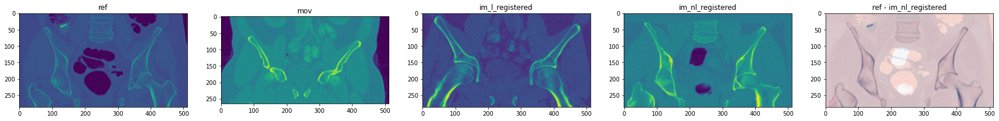

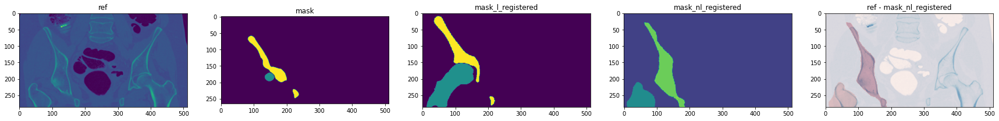

------plots done!------
Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


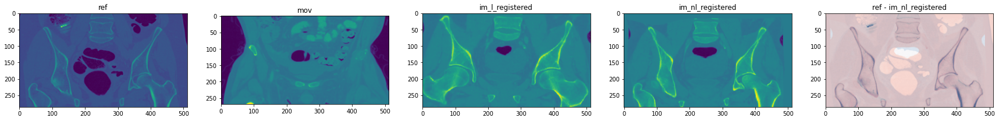

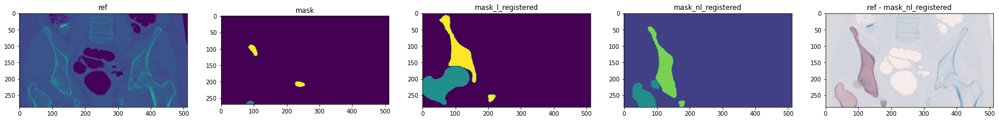

------plots done!------
Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


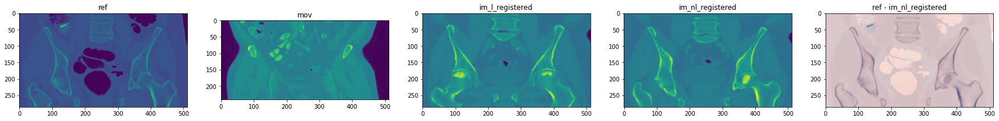

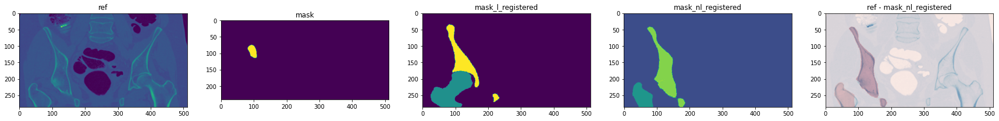

------plots done!------


In [4]:
# call algorithm
majority_v_femur, majority_v_hip = seg_atlas(im_ref, atlas_ct_list, atlas_seg_list)

Dice: 0.9215169047636647
Hausdorff: 7.431740318762535


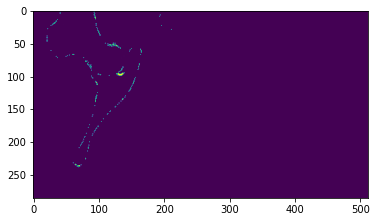

(0.9215169047636647, 7.431740318762535)

In [6]:
# evaluate results of the segmentation of right bones as a whole after majority voting + ploting the difference
assessment(c_masks_right[0]>0, majority_voting_40r>0)

Dice: 0.9553712539577052
Hausdorff: 7.431740318762535


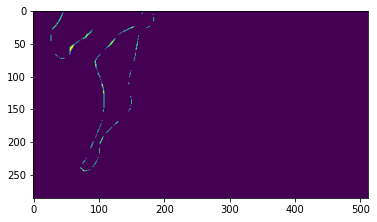

(0.9553712539577052, 7.431740318762535)

In [7]:
# evaluate results of the segmentation of right bones as a whole on closing of majority voting + ploting the difference
assessment(c_masks_right[0]>0, majority_closed_40r>0) 

In [50]:
# evaluate results of the segmentation per bones
print('Right femur image 40 Dice and Hausdorff: '+ str(assessment(c_masks[0]==1, majority_v_femur)))
print('Right hip image 40 Dice and Hausdorff: ' + str(assessment(c_masks[0]==3, majority_v_hip)))

Right femur image 40 Dice and Hausdorff: (0.4106864081357345, 129.11202506062)
Right hip image 40 Dice and Hausdorff: (0.9645295658273592, 7.688841505242994)


##### Image 41 right

In [6]:
#inputs
im_ref = c_images[1] # 41
atlas_ct_list = g_images
atlas_seg_list = g_masks_right

Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


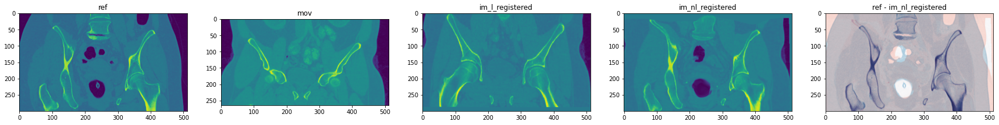

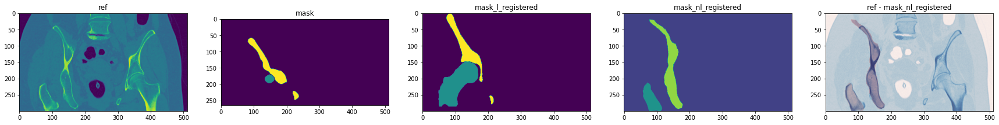

------plots done!------
Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


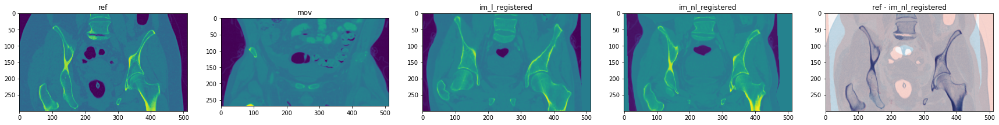

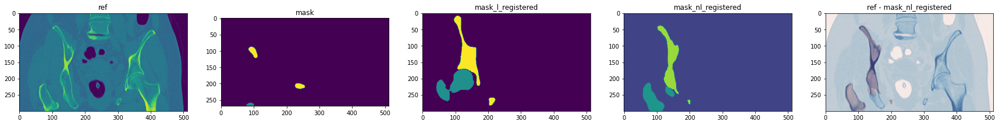

------plots done!------
Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


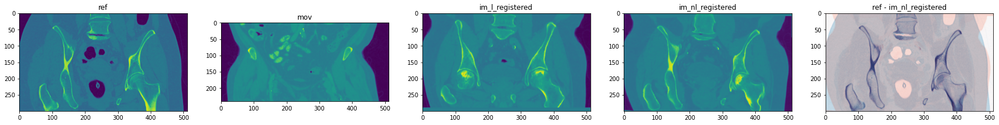

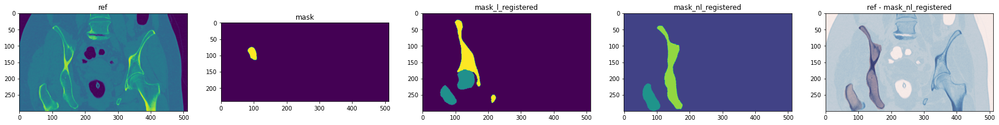

------plots done!------


In [7]:
# feeding algorithm
majority_v_femur_41r, majority_v_hip_41r = seg_atlas(im_ref, atlas_ct_list, atlas_seg_list)

Dice: 0.8919696539622739
Hausdorff: 5.949822738956178


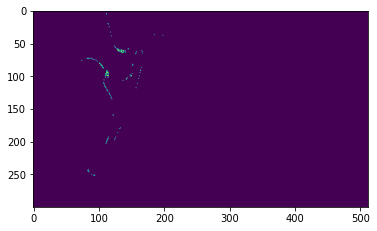

(0.8919696539622739, 5.949822738956178)

In [18]:
# evaluate results of the segmentation of right bones as a whole after majority voting + ploting the difference
assessment(c_masks_right[1]>0, majority_voting_41r>0) 

Dice: 0.9589648347259424
Hausdorff: 5.764207142998288


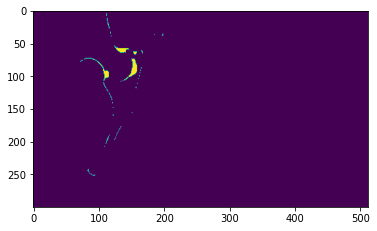

(0.9589648347259424, 5.764207142998288)

In [15]:
# evaluate results of the segmentation of right bones as a whole on closing of majority voting + ploting the difference
assessment(c_masks_right[1]>0, majority_closed_41r>0) 

In [53]:
# evaluate results of the segmentation per bones
print('Right femur image 41 Dice and Hausdorff: '+ str(assessment(c_masks[1]==1, majority_v_femur_41r)))
print('Right hip image 41 Dice and Hausdorff: '+ str(assessment(c_masks[1]==3, majority_v_hip_41r)))

Right femur image 41 Dice and Hausdorff: (0.44437774930058693, 132.7715166477788)
Right hip image 41 Dice and Hausdorff: (0.9524516910041305, 6.161209930999033)


##### Image 42 right

In [9]:
im_ref = c_images[2] # 42
atlas_ct_list = g_images
atlas_seg_list = g_masks_right

Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


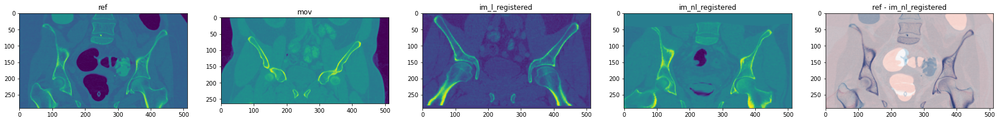

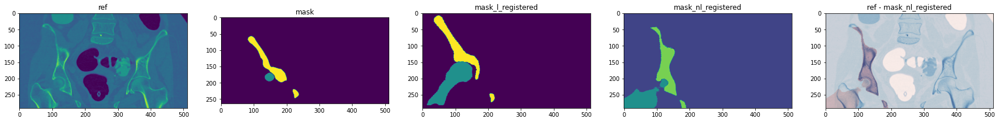

------plots done!------
Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


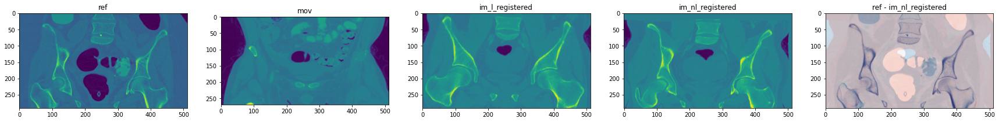

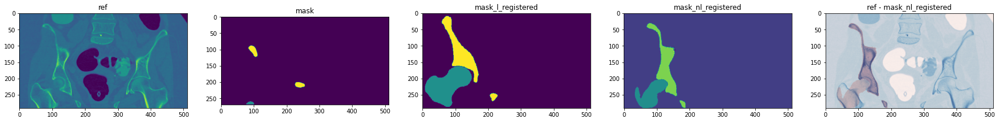

------plots done!------
Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


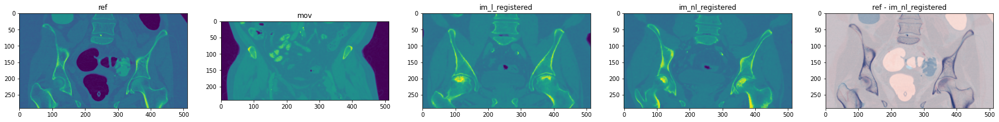

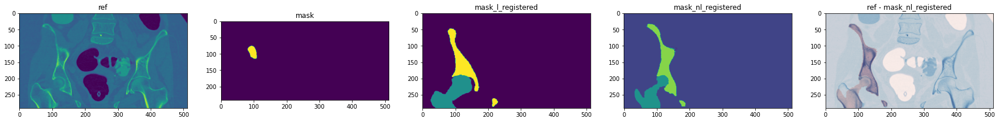

------plots done!------


In [10]:
majority_v_femur_42r, majority_v_hip_42r = seg_atlas(im_ref, atlas_ct_list, atlas_seg_list)

Dice: 0.8817405026842292
Hausdorff: 35.218700686668186


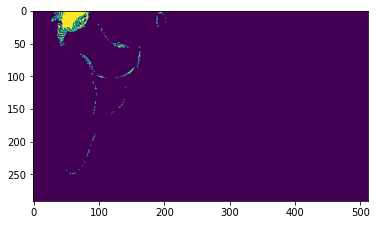

(0.8817405026842292, 35.218700686668186)

In [31]:
# evaluate results of the segmentation of right bones as a whole after majority voting + ploting the difference
assessment(c_masks_right[2]>0, majority_voting_42r>0) 

In [ ]:
# evaluate results of the segmentation of right bones as a whole on closing of majority voting + ploting the difference
assessment(c_masks_right[2]>0, majority_closed_r42>0) 

In [52]:
# evaluate results of the segmentation per bones
print('Right femur image 42 Dice and Hausdorff: '+ str(assessment(c_masks[2]==1, majority_v_femur_42r)))
print('Right hip image 42 Dice and Hausdorff: '+ str(assessment(c_masks[2]==3, majority_v_hip_42r)))

Right femur image 42 Dice and Hausdorff: (0.3664591311130008, 133.66638546930164)
Right hip image 42 Dice and Hausdorff: (0.9568905087209679, 5.446406700556035)


### left part

##### Image 40 left

Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


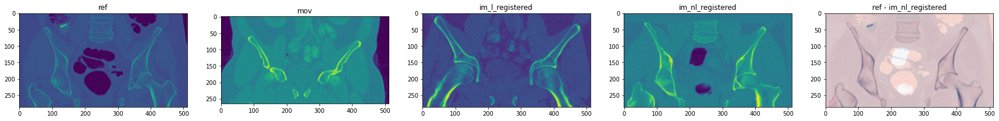

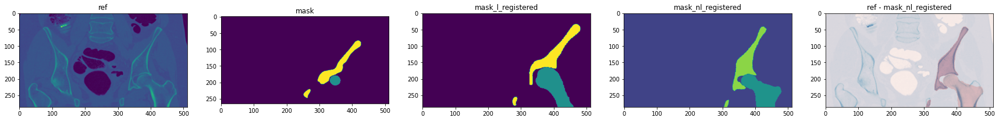

------plots done!------
Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


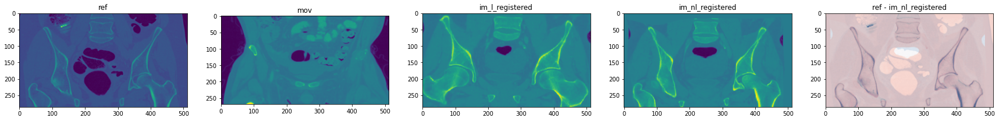

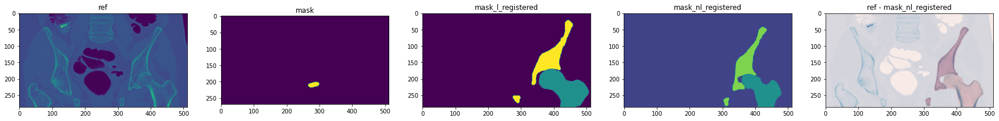

------plots done!------
Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


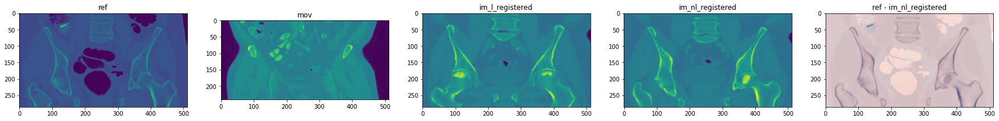

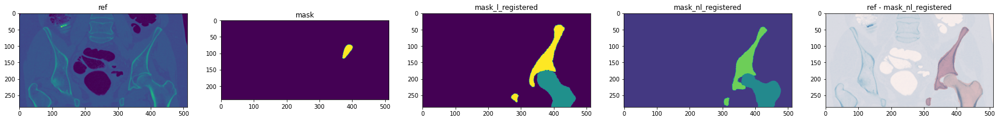

------plots done!------


In [12]:
im_ref = c_images[0] # 40
atlas_ct_list = g_images
atlas_seg_list = g_masks_left
majority_v_femur_40l, majority_v_hip_40l = seg_atlas(im_ref, atlas_ct_list, atlas_seg_list) 

Dice: 0.9143582768957478
Hausdorff: 7.865197272079404


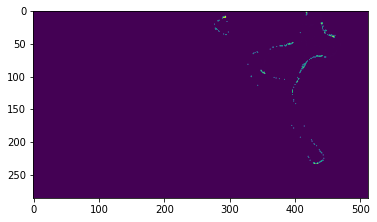

(0.9143582768957478, 7.865197272079404)

In [5]:
# evaluate results of the segmentation of right bones as a whole after majority voting + ploting the difference
assessment(c_masks_left[0]>0, majority_voting_40l>0) 

Dice: 0.9561878281689156
Hausdorff: 7.865197272079404


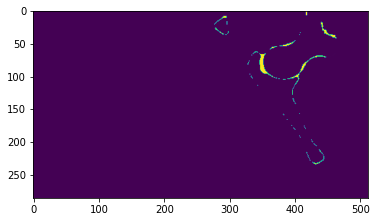

(0.9561878281689156, 7.865197272079404)

In [6]:
# evaluate results of the segmentation of right bones as a whole on closing of majority voting + ploting the difference
assessment(c_masks_left[0]>0, majority_closed_40l>0) # evaluate results of the segmentation after closing operation to majority voting

In [55]:
# evaluate results of the segmentation per bones
print('Left femur image 40 Dice and Hausdorff: '+ str(assessment(c_masks[0]==2, majority_v_femur_40l)))
print('Left hip image 40 Dice and Hausdorff: '+ str(assessment(c_masks[0]==4, majority_v_hip_40l)))

Left femur image 40 Dice and Hausdorff: (0.42055029911375097, 129.40779383579797)
Left hip image 40 Dice and Hausdorff: (0.9634252395567592, 7.779621598278137)


##### Image 41 left

In [19]:
im_ref = c_images[1] # 41
atlas_ct_list = g_images
atlas_seg_list = g_masks_left

Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


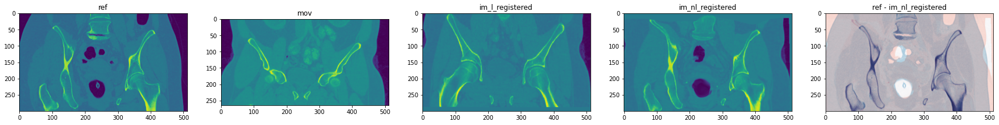

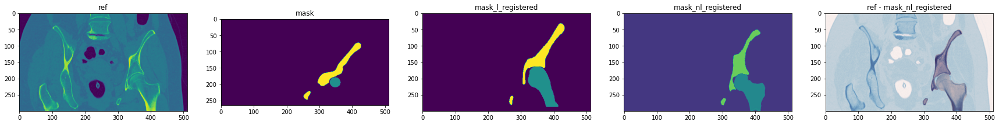

------plots done!------
Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


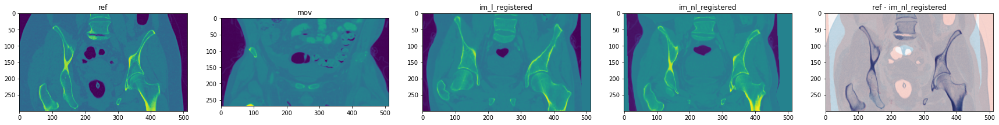

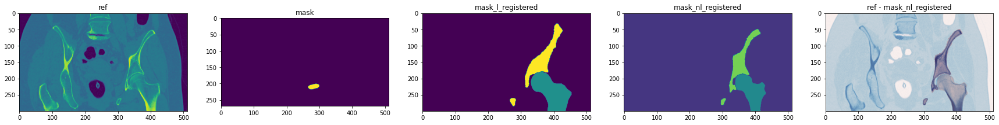

------plots done!------
Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


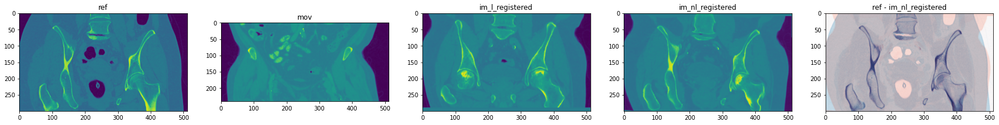

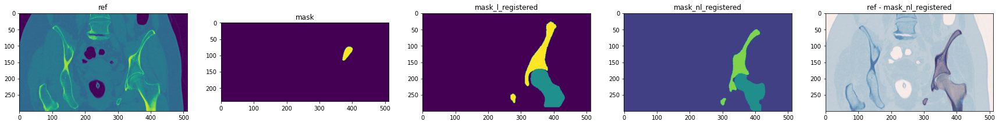

------plots done!------


In [20]:
majority_v_femur_41l, majority_v_hip_41l = seg_atlas(im_ref, atlas_ct_list, atlas_seg_list) 

Dice: 0.9072867426174687
Hausdorff: 5.633673867912483


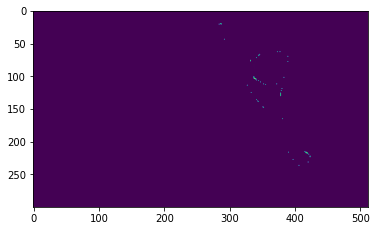

(0.9072867426174687, 5.633673867912483)

In [33]:
# evaluate results of the segmentation of right bones as a whole after majority voting + ploting the difference
assessment(c_masks_left[1]>0, majority_voting_41l>0) # evaluate results of the segmentation after majority voting

Dice: 0.9626396003022925
Hausdorff: 5.633673867912483


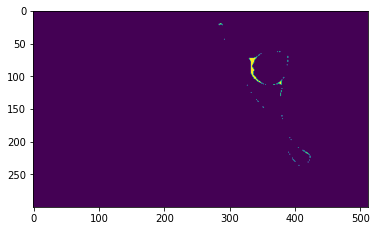

(0.9626396003022925, 5.633673867912483)

In [20]:
# evaluate results of the segmentation of right bones as a whole on closing of majority voting + ploting the difference
assessment(c_masks_left[1]>0, majority_closed_41l>0) # evaluate results of the segmentation after closing operation to majority voting

In [56]:
# evaluate results of the segmentation per bones
print('Left femur image 41 Dice and Hausdorff: '+ str(assessment(c_masks[1]==2, majority_v_femur_41l)))
print('Left hip image 41 Dice and Hausdorff: '+ str(assessment(c_masks[1]==4, majority_v_hip_41l)))

Left femur image 41 Dice and Hausdorff: (0.4356296509728109, 132.85429400583703)
Left hip image 41 Dice and Hausdorff: (0.9588640631575223, 4.892371893341399)


##### Image 42 left

In [22]:
im_ref = c_images[2] # 42
atlas_ct_list = g_images
atlas_seg_list = g_masks_left

Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


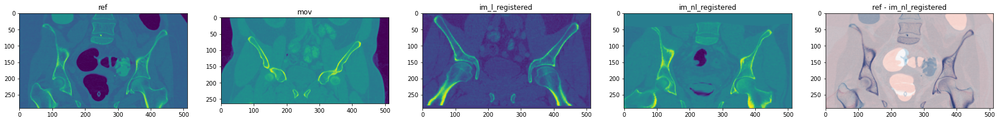

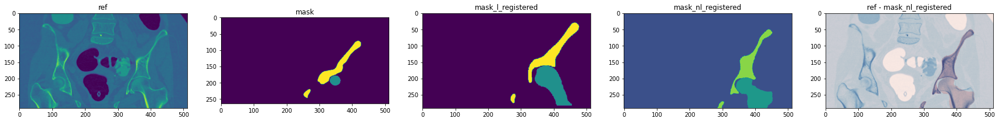

------plots done!------
Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


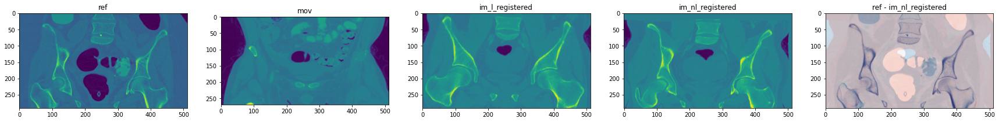

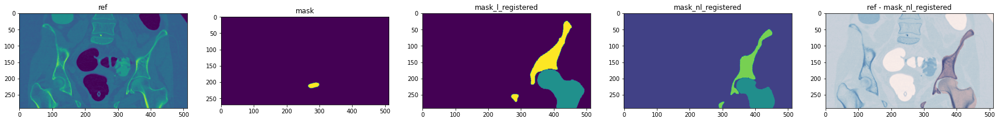

------plots done!------
Linear estimation done
L registration done
Non-linear estimation done
NL registration done
-------plots coming-------


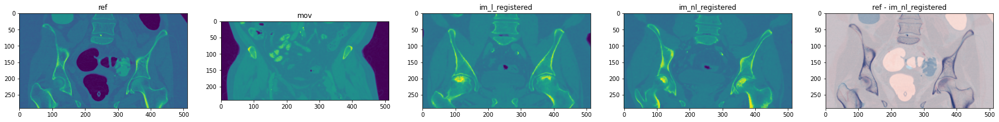

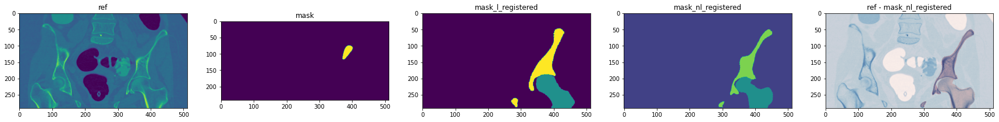

------plots done!------


In [23]:
majority_v_femur_42l, majority_v_hip_42l = seg_atlas(im_ref, atlas_ct_list, atlas_seg_list) 

Dice: 0.908138613215034
Hausdorff: 10.442876842995014


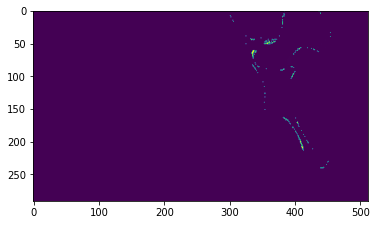

(0.908138613215034, 10.442876842995014)

In [36]:
# evaluate results of the segmentation of right bones as a whole after majority voting + ploting the difference
assessment(c_masks_left[2]>0, majority_voting_42l>0) # evaluate results of the segmentation after majority voting

Dice: 0.9540564333749992
Hausdorff: 10.412189793173312


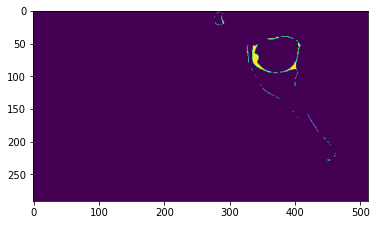

(0.9540564333749992, 10.412189793173312)

In [37]:
# evaluate results of the segmentation of right bones as a whole on closing of majority voting + ploting the difference
assessment(c_masks_left[2]>0, majority_closed_42l>0) # evaluate results of the segmentation after closing operation to majority voting

In [57]:
# evaluate results of the segmentation per bones
print('Left femur image 42 Dice and Hausdorff: '+ str(assessment(c_masks[2]==2, majority_v_femur_42l)))
print('Left hip image 42 Dice and Hausdorff: '+ str(assessment(c_masks[2]==4, majority_v_hip_42l)))

Left femur image 42 Dice and Hausdorff: (0.4099566394446254, 135.28675664246677)
Left hip image 42 Dice and Hausdorff: (0.9586805052699332, 8.385611608956147)


## Plotting of final segmentations

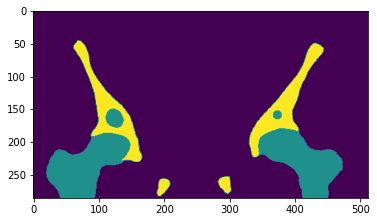

In [43]:
#40
plt.imshow(np.flipud(sitk.GetArrayFromImage(majority_v_femur_40l+majority_v_hip_40l+majority_v_femur+majority_v_hip))[:,230,:])

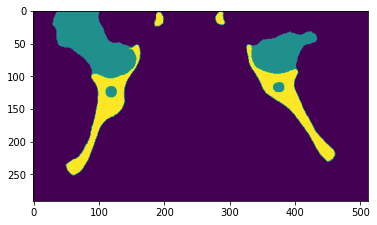

In [35]:
#41
plt.imshow(sitk.GetArrayFromImage(majority_v_femur_42l+majority_v_hip_42l+majority_v_femur_42r+majority_v_hip_42r)[:,230,:])

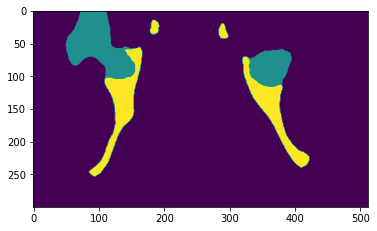

In [34]:
#42
plt.imshow(sitk.GetArrayFromImage(majority_v_femur_41l+majority_v_hip_41l+majority_v_femur_41r+majority_v_hip_41r)[:,230,:])